In [5]:
import numpy as np
import plotly.express as px
import cv2
import os

%matplotlib inline

In [2]:
image1 = cv2.imread('../AerialImageDataset/train/images/austin2.tif')
image1.shape

(5000, 5000, 3)

In [37]:
np.max(image1), np.min(image1)

(255, 0)


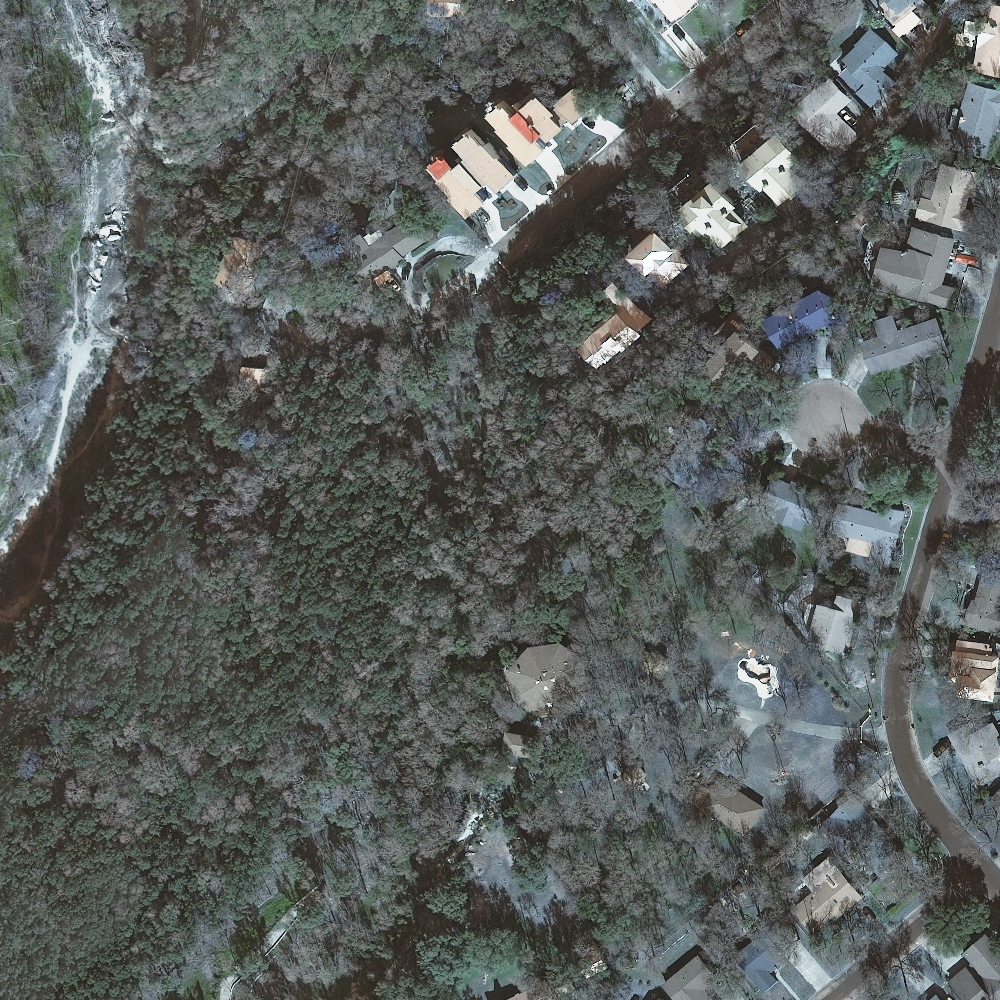

In [3]:
fig = px.imshow(image1[:1000, :1000])
fig.show()

In [25]:
from PIL import Image, ImageOps
import re
from pathlib import Path

In [9]:
PATH_IMAGE =  '../AerialImageDataset/train/images/'
PATH_MASK =  '../AerialImageDataset/train/gt/'

list_mask = os.listdir(PATH_MASK)
list_img = os.listdir(PATH_IMAGE)
my_list = list(set(list_mask) & set(list_img))

In [10]:
def splitter(list_, key):
    list = [string.split(key)[0] for string in list_]
    return list


In [11]:
my_list = splitter(my_list, '.')

In [13]:
my_list[:5]

['kitsap25', 'kitsap4', 'austin35', 'austin10', 'kitsap20']

In [39]:
def image_crop(image, step, size, path, item):
    k = 0
    Path(path).mkdir(parents=True, exist_ok=True)
    path = path + item
    for j in range(0,image.shape[0], step):
        for i in range(0,image.shape[1], step):
            im = image[j: j+size, i: i+size].astype(float)
            # print(im.shape)
            k+=1
            if im.shape[0] == size and im.shape[1] == size:
                im = Image.fromarray((im).astype(np.uint8))
                if 'gt' in path:
                    im = ImageOps.grayscale(im)
                im.save(path + f'__{j}_{i}.png')


In [43]:
def iteration(my_list, input_path):
    list_dir = ['images/', 'gt/']
    output_path = re.sub('train', 'crop', input_path)
    for item in my_list:
        for dir in list_dir:
            img = cv2.imread(input_path + dir + item + '.tif')
            image_crop(image= img, step=500, size=500, path=output_path + dir, item=item)

input_path = '../AerialImageDataset/train/'
iteration(my_list, input_path)

In [32]:
img = cv2.imread('../AerialImageDataset/train/gt/austin3.tif')

In [33]:
img.shape

(5000, 5000, 3)

In [35]:
np.min(img), np.max(img)

(0, 255)


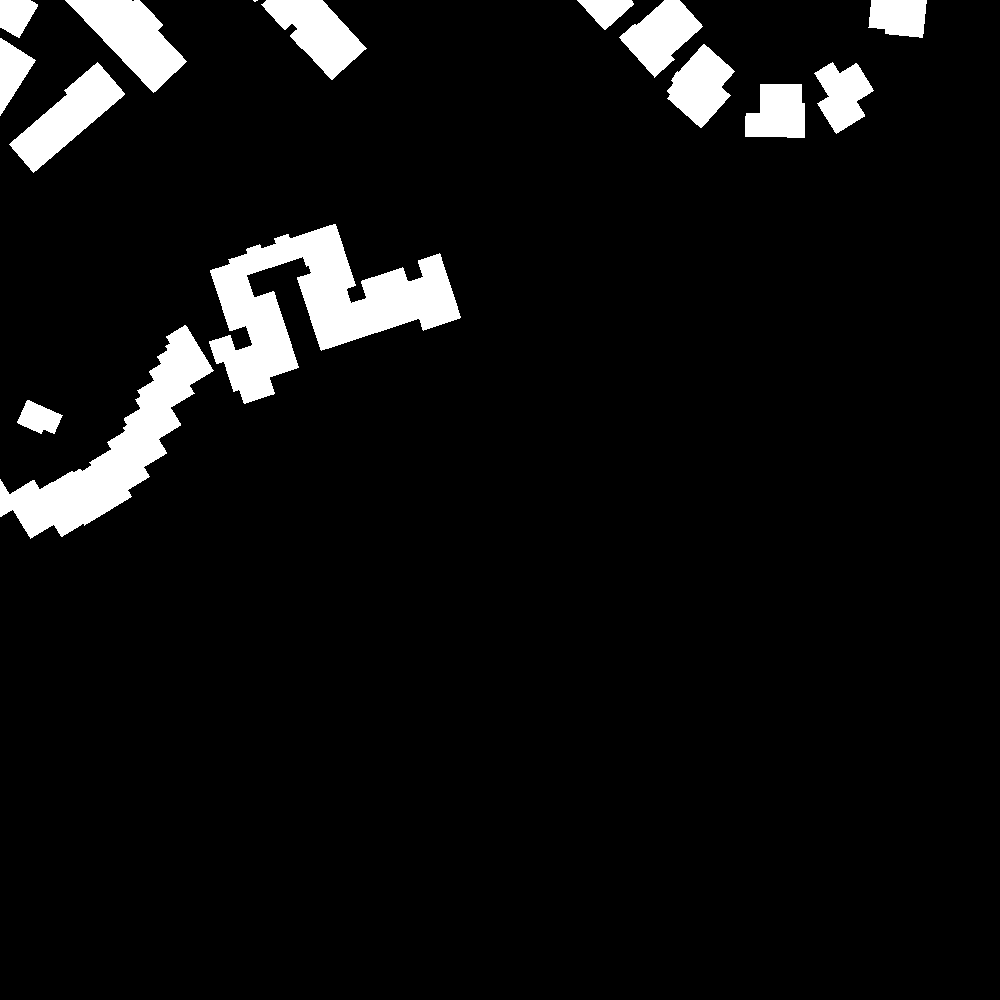

In [36]:
fig = px.imshow(img[:1000, :1000])
fig.show()